# Tensorflow 2 Object Detection: Train model



<table align="left"><td>
  <a target="_blank"  href="https://colab.research.google.com/github/TannerGilbert/Tensorflow-Object-Detection-API-Train-Model/blob/master/Tensorflow_2_Object_Detection_Train_model.ipynb">
    <img src="https://www.tensorflow.org/images/colab_logo_32px.png" />Run in Google Colab
  </a>
</td><td>
  <a target="_blank"  href="https://github.com/TannerGilbert/Tensorflow-Object-Detection-API-Train-Model/blob/master/Tensorflow_2_Object_Detection_Train_model.ipynb">
    <img width=32px src="https://www.tensorflow.org/images/GitHub-Mark-32px.png" />View source on GitHub</a>
</td></table>

## Installation

Installing the Tensorflow Object Detection API became a lot easier with the relase of Tensorflow 2. The following few cells are all that is needed in order to install the OD API.

In [19]:
# Load Images Data and the Bounding Box CSV for Train and Test from Google Drive
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
# Store the train and test images along with the csv annotation files in Googl Drive and copy it ovefr to Colab working directory
# You also need to update the class_text_to_int function in generate_tfrecord.py (https://github.com/EdjeElectronics/TensorFlow-Object-Detection-API-Tutorial-Train-Multiple-Objects-Windows-10/blob/master/generate_tfrecord.py)
# based on your custom classes and create a class label to id mapping file labelmap.pbtxt (that matches what you updated in generate_tfrecord.py)
%%bash
cp /content/drive/MyDrive/labels_aug_train.csv .
cp /content/drive/MyDrive/labels_aug_test.csv .
cp -r /content/drive/MyDrive/Images_Aug .
cp /content/drive/MyDrive/generate_tfrecord.py .
cp /content/drive/MyDrive/labelmap.pbtxt .

In [ ]:
%%bash
cp /content/drive/MyDrive/model_config.config .

In [ ]:
from google.colab import drive
drive.flush_and_unmount()

In [ ]:
!pip install tensorflow==2.15.0

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 475.2/475.2 MB 3.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 63.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.5/5.5 MB 104.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 80.9 MB/s eta 0:00:00
  Attempting uninstall: ml-dtypes
    Found existing installation: ml-dtypes 0.4.0
    Uninstalling ml-dtypes-0.4.0:
      Successfully uninstalled ml-dtypes-0.4.0
  Attempting uninstall: keras
    Found existing installation: keras 3.4.1
    Uninstalling keras-3.4.1:
      Successfully uninstalled keras-3.4.1
  Attempting uninstall: tensorboard
    Found existing installation: tensorboard 2.17.0
    Uninstalling tensorboard-2.17.0:
      Successfully uninstalled tensorboard-2.17.0
  Attempting uninstall: tensorflow
    Found existing installation: tensorflow 2.17.0
    Uninstalling tensorflow-2.17.0:
      Successfully uninstalled tensorflow-2.17.0
ERROR: pip's dependenc

In [ ]:
!pip install -q tflite_support

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 60.8/60.8 MB 23.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 238.8/238.8 kB 26.5 MB/s eta 0:00:00


In [ ]:
import os
import pathlib

# Clone the tensorflow models repository if it doesn't already exist
if "models" in pathlib.Path.cwd().parts:
  while "models" in pathlib.Path.cwd().parts:
    os.chdir('..')
elif not pathlib.Path('models').exists():
  !git clone --depth 1 https://github.com/tensorflow/models

Cloning into 'models'...
remote: Enumerating objects: 4109, done.
remote: Counting objects: 100% (4109/4109), done.
remote: Compressing objects: 100% (3112/3112), done.
remote: Total 4109 (delta 1190), reused 1979 (delta 935), pack-reused 0
Receiving objects: 100% (4109/4109), 45.36 MiB | 38.04 MiB/s, done.
Resolving deltas: 100% (1190/1190), done.


In [ ]:
# Install the Object Detection API
%%bash
cd models/research/
protoc object_detection/protos/*.proto --python_out=.
cp object_detection/packages/tf2/setup.py .
python -m pip install .

Processing /content/models/research
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 14.5/14.5 MB 50.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.9/2.9 MB 74.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.6/49.6 MB 36.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.8/67.8 kB 9.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 116.6/116.6 kB 16.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.6/43.6 kB 5.8 MB/s eta 0:00:00
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 242.5/242.5 kB 31.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.2/5.2 MB 108.5 MB/s eta 0:00:00
     ━━━━━━

In [ ]:
#run model builder test
!python /content/models/research/object_detection/builders/model_builder_tf2_test.py

2024-07-19 15:56:53.316284: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-07-19 15:56:53.334951: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-07-19 15:56:53.340632: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-07-19 15:56:53.354223: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-07-19 15:56:54.449887: W tensorflow/comp

## Prepare data

### generate_tfrecord.py and labelmap
Images and bounding box CSV files for Train and Test were copied over from Google drive to the root working folder in Colab earlier.

In [ ]:
!python generate_tfrecord.py --csv_input=labels_aug_train.csv --image_dir=Images_Aug/Train --output_path=train.record
!python generate_tfrecord.py --csv_input=labels_aug_test.csv --image_dir=Images_Aug/Test --output_path=test.record

2024-07-24 13:12:07.298524: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-07-24 13:12:07.318220: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-07-24 13:12:07.324106: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-07-24 13:12:07.339104: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-07-24 13:12:08.388100: W tensorflow/compiler/tf2

In [ ]:
train_record_path = 'train.record'
test_record_path = 'test.record'
labelmap_path = 'labelmap.pbtxt'

## Configuring training

Now that the data is ready it's time to create a training configuration. The OD API supports lots of models, each with its own config file. In this notebook I'm making use of EfficientDet, but you can replace it with any model available in the [Tensorflow 2 Detection Model Zoo](https://github.com/tensorflow/models/blob/master/research/object_detection/g3doc/tf2_detection_zoo.md).

In [ ]:
batch_size = 16
num_steps = 10000
num_eval_steps = 1000

In [ ]:
# Model trined on 512x512 resolution
!wget http://download.tensorflow.org/models/object_detection/tf2/20200711/efficientdet_d0_coco17_tpu-32.tar.gz
!tar -xf efficientdet_d0_coco17_tpu-32.tar.gz

# Model trined on 1024x1024 resolution
# !wget http://download.tensorflow.org/models/object_detection/tf2/20200711/efficientdet_d4_coco17_tpu-32.tar.gz
# !tar -xf efficientdet_d4_coco17_tpu-32.tar.gz

# Model trined on 768x768 resolution
# !wget http://download.tensorflow.org/models/object_detection/tf2/20200711/efficientdet_d2_coco17_tpu-32.tar.gz
# !tar -xf efficientdet_d2_coco17_tpu-32.tar.gz


--2024-07-24 13:12:37--  http://download.tensorflow.org/models/object_detection/tf2/20200711/efficientdet_d0_coco17_tpu-32.tar.gz
Resolving download.tensorflow.org (download.tensorflow.org)... 74.125.197.207, 74.125.135.207, 74.125.142.207, ...
Connecting to download.tensorflow.org (download.tensorflow.org)|74.125.197.207|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 30736482 (29M) [application/x-tar]
Saving to: ‘efficientdet_d0_coco17_tpu-32.tar.gz’

efficientdet_d0_coc 100%[===================>]  29.31M   115MB/s    in 0.3s    

2024-07-24 13:12:37 (115 MB/s) - ‘efficientdet_d0_coco17_tpu-32.tar.gz’ saved [30736482/30736482]



In [ ]:
fine_tune_checkpoint = 'efficientdet_d0_coco17_tpu-32/checkpoint/ckpt-0'

In [ ]:
# EfficientDet 512x512 resolution model spec
# !wget https://raw.githubusercontent.com/tensorflow/models/master/research/object_detection/configs/tf2/ssd_efficientdet_d0_512x512_coco17_tpu-8.config
# !wget https://github.com/tensorflow/models/blob/master/research/object_detection/configs/tf2/ssd_efficientdet_d0_512x512_coco17_tpu-8.config
# base_config_path = 'ssd_efficientdet_d0_512x512_coco17_tpu-8.config'

# EfficientDet 1024x1024 resolution model spec
# !wget https://github.com/tensorflow/models/blob/master/research/object_detection/configs/tf2/ssd_efficientdet_d4_1024x1024_coco17_tpu-32.config
# base_config_path = 'ssd_efficientdet_d4_1024x1024_coco17_tpu-32.config'

# EfficientDet 768x768 resolution model spec
# !wget https://github.com/tensorflow/models/blob/master/research/object_detection/configs/tf2/ssd_efficientdet_d2_768x768_coco17_tpu-8.config
%%bash
cp /content/models/research/object_detection/configs/tf2/ssd_efficientdet_d0_512x512_coco17_tpu-8.config .
# cp /content/models/research/object_detection/configs/tf2/ssd_efficientdet_d2_768x768_coco17_tpu-8.config .
# cp /content/models/research/object_detection/configs/tf2/ssd_efficientdet_d4_1024x1024_coco17_tpu-32.config .

In [ ]:
base_config_path = 'ssd_efficientdet_d0_512x512_coco17_tpu-8.config'
print(labelmap_path)
print(fine_tune_checkpoint)
print(train_record_path)
print(batch_size)
print(num_steps)

labelmap.pbtxt
efficientdet_d0_coco17_tpu-32/checkpoint/ckpt-0
train.record
16
10000


In [ ]:
# edit configuration file (from https://colab.research.google.com/drive/1sLqFKVV94wm-lglFq_0kGo2ciM0kecWD)

import re

with open(base_config_path) as f:
    config = f.read()

with open('model_config.config', 'w') as f:

  # Set labelmap path
  config = re.sub('label_map_path: ".*?"',
             'label_map_path: "{}"'.format(labelmap_path), config)

  # Set fine_tune_checkpoint path
  config = re.sub('fine_tune_checkpoint: ".*?"',
                  'fine_tune_checkpoint: "{}"'.format(fine_tune_checkpoint), config)

  # Set train tf-record file path
  config = re.sub('(input_path: ".*?)(PATH_TO_BE_CONFIGURED/train)(.*?")',
                  'input_path: "{}"'.format(train_record_path), config)

  # Set test tf-record file path
  config = re.sub('(input_path: ".*?)(PATH_TO_BE_CONFIGURED/val)(.*?")',
                  'input_path: "{}"'.format(test_record_path), config)

  # Set number of classes.
  config = re.sub('num_classes: [0-9]+',
                  'num_classes: {}'.format(10), config)

  # Set batch size
  config = re.sub('batch_size: [0-9]+',
                  'batch_size: {}'.format(batch_size), config)

  # Set training steps
  config = re.sub('num_steps: [0-9]+',
                  'num_steps: {}'.format(num_steps), config)

  # Set fine-tune checkpoint type to detection
  config = re.sub('fine_tune_checkpoint_type: "classification"',
             'fine_tune_checkpoint_type: "{}"'.format('detection'), config)

  f.write(config)

In [ ]:
%cat model_config.config

 # SSD with EfficientNet-b0 + BiFPN feature extractor,
# shared box predictor and focal loss (a.k.a EfficientDet-d0).
# See EfficientDet, Tan et al, https://arxiv.org/abs/1911.09070
# See Lin et al, https://arxiv.org/abs/1708.02002
# Trained on COCO, initialized from an EfficientNet-b0 checkpoint.
#
# Train on TPU-8

model {
  ssd {
    inplace_batchnorm_update: true
    freeze_batchnorm: false
    num_classes: 10
    add_background_class: false
    box_coder {
      faster_rcnn_box_coder {
        y_scale: 10.0
        x_scale: 10.0
        height_scale: 5.0
        width_scale: 5.0
      }
    }
    matcher {
      argmax_matcher {
        matched_threshold: 0.5
        unmatched_threshold: 0.5
        ignore_thresholds: false
        negatives_lower_than_unmatched: true
        force_match_for_each_row: true
        use_matmul_gather: true
      }
    }
    similarity_calculator {
      iou_similarity {
      }
    }
    encode_background_as_zeros: true
    anchor_generator {
      

In [ ]:
model_dir = 'training/'
pipeline_config_path = 'model_config.config'

## Train detector

In [ ]:
# Run this block first and use the refresh arrow that will appear in the header once the training below starts
%reload_ext tensorboard
%tensorboard --logdir 'training/train'

Reusing TensorBoard on port 6006 (pid 6810), started 5:00:50 ago. (Use '!kill 6810' to kill it.)

<IPython.core.display.Javascript object>

In [ ]:
# Run this code to fix an error - AttributeError: module 'tensorflow.python.ops.control_flow_ops' has no attribute 'case'
# Reference: https://github.com/tensorflow/models/issues/11099

import shutil
import re

original_path = '/usr/local/lib/python3.10/dist-packages/tf_slim/data/tfexample_decoder.py'
with open(original_path, 'r') as file:
  content = file.read()
  content = re.sub(r'import abc', 'import tensorflow as tf\n\nimport abc', content)
  content = re.sub(r'control_flow_ops.case', 'tf.case', content)
  content = re.sub(r'control_flow_ops.cond', 'tf.compat.v1.cond', content)

with open(original_path, 'w') as file:
  file.write(content)

print(f"File {original_path} fixed.")

File /usr/local/lib/python3.10/dist-packages/tf_slim/data/tfexample_decoder.py fixed.


In [18]:
!python /content/models/research/object_detection/model_main_tf2.py \
    --pipeline_config_path={pipeline_config_path} \
    --model_dir={model_dir} \
    --alsologtostderr \
    --num_train_steps={num_steps} \
    --sample_1_of_n_eval_examples=1 \
    --num_eval_steps={num_eval_steps}

2024-07-24 13:15:24.321168: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-07-24 13:15:24.321217: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-07-24 13:15:24.322496: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-07-24 13:15:24.329423: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-07-24 13:15:25.319839: W tensorflow/compiler/tf2

## Export model inference graph

In [20]:
output_directory = 'inference_graph'

!python /content/models/research/object_detection/exporter_main_v2.py \
    --trained_checkpoint_dir {model_dir} \
    --output_directory {output_directory} \
    --pipeline_config_path {pipeline_config_path}

2024-07-24 16:00:42.876780: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-07-24 16:00:42.876843: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-07-24 16:00:42.878861: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-07-24 16:00:42.888396: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-07-24 16:00:43.848100: W tensorflow/compiler/tf2

### Download model

In [21]:
# Zip and download your new model to your system
from google.colab import files
!zip -r new_model.zip /content/{output_directory}/saved_model
files.download(f'new_model.zip')

  adding: content/inference_graph/saved_model/ (stored 0%)
  adding: content/inference_graph/saved_model/saved_model.pb (deflated 92%)
  adding: content/inference_graph/saved_model/assets/ (stored 0%)
  adding: content/inference_graph/saved_model/variables/ (stored 0%)
  adding: content/inference_graph/saved_model/variables/variables.data-00000-of-00001 (deflated 36%)
  adding: content/inference_graph/saved_model/variables/variables.index (deflated 78%)
  adding: content/inference_graph/saved_model/fingerprint.pb (stored 0%)


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
# Optional: save a copy of the training data to your drive in case you want to re-train later
from google.colab import drive
drive.mount('/content/drive')
!cp -r training/ drive/MyDrive/

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


### Test trained model on test images

In [22]:
import io
import os
import scipy.misc
import numpy as np
import six
import time
import glob
from IPython.display import display

from six import BytesIO

import matplotlib
import matplotlib.pyplot as plt
from PIL import Image, ImageDraw, ImageFont

import tensorflow as tf
from object_detection.utils import ops as utils_ops
from object_detection.utils import label_map_util
from object_detection.utils import visualization_utils as vis_util

%matplotlib inline

In [23]:
def load_image_into_numpy_array(path):
  """Load an image from file into a numpy array.

  Puts image into numpy array to feed into tensorflow graph.
  Note that by convention we put it into a numpy array with shape
  (height, width, channels), where channels=3 for RGB.

  Args:
    path: a file path (this can be local or on colossus)

  Returns:
    uint8 numpy array with shape (img_height, img_width, 3)
  """
  img_data = tf.io.gfile.GFile(path, 'rb').read()
  image = Image.open(BytesIO(img_data))
  (im_width, im_height) = image.size
  return np.array(image.getdata()).reshape(
      (im_height, im_width, 3)).astype(np.uint8)

In [24]:
category_index = label_map_util.create_category_index_from_labelmap(labelmap_path, use_display_name=True)

In [25]:
tf.keras.backend.clear_session()
model = tf.saved_model.load(f'/content/{output_directory}/saved_model')

In [26]:
def run_inference_for_single_image(model, image):
  image = np.asarray(image)
  # The input needs to be a tensor, convert it using `tf.convert_to_tensor`.
  input_tensor = tf.convert_to_tensor(image)
  # The model expects Elektrische Bauteile batch of images, so add an axis with `tf.newaxis`.
  input_tensor = input_tensor[tf.newaxis,...]

  # Run inference
  model_fn = model.signatures['serving_default']
  output_dict = model_fn(input_tensor)
  # All outputs are batches tensors.
  # Convert to numpy arrays, and take index [0] to remove the batch dimension.
  # We're only interested in the first num_detections.
  num_detections = int(output_dict.pop('num_detections'))
  output_dict = {key:value[0, :num_detections].numpy()
                 for key,value in output_dict.items()}
  output_dict['num_detections'] = num_detections

  # detection_classes should be ints.
  output_dict['detection_classes'] = output_dict['detection_classes'].astype(np.int64)

  # Handle models with masks:
  if 'detection_masks' in output_dict:
    # Reframe the the bbox mask to the image size.
    detection_masks_reframed = utils_ops.reframe_box_masks_to_image_masks(
              output_dict['detection_masks'], output_dict['detection_boxes'],
               image.shape[0], image.shape[1])
    detection_masks_reframed = tf.cast(detection_masks_reframed > 0.5,
                                       tf.uint8)
    output_dict['detection_masks_reframed'] = detection_masks_reframed.numpy()

  return output_dict

In [27]:
def select_best_bbs(output_dict, score_threshold):
  # Assume 'detection_boxes', 'detection_scores', and 'detection_classes' are the outputs from the model inference
  # Example format of model inference output
  # detection_boxes: [num_detections, 4] tensor of bounding boxes
  # detection_scores: [num_detections] tensor of detection scores
  # detection_classes: [num_detections] tensor of detection class indices

  detection_boxes = output_dict['detection_boxes']
  detection_classes = output_dict['detection_classes']
  detection_scores = output_dict['detection_scores']
  print(type(detection_boxes))

  # Convert the outputs to numpy arrays (if they are tensors)
  # detection_boxes = detection_boxes.numpy()
  # detection_scores = detection_scores.numpy()
  # detection_classes = detection_classes.numpy()

  # Filter out the detections with a score lower than the threshold
  valid_detections_mask = detection_scores >= score_threshold
  filtered_boxes = detection_boxes[valid_detections_mask]
  filtered_scores = detection_scores[valid_detections_mask]
  filtered_classes = detection_classes[valid_detections_mask]

  # Apply non-maximum suppression
  selected_indices = tf.image.non_max_suppression(
      boxes=filtered_boxes,
      scores=filtered_scores,
      max_output_size=100,  # Maximum number of boxes to be selected by NMS
      iou_threshold=0.5,  # Intersection-over-union threshold
      score_threshold=score_threshold
  )

  # Select the boxes, scores, and classes using the indices from NMS
  selected_boxes = tf.gather(filtered_boxes, selected_indices).numpy()
  selected_scores = tf.gather(filtered_scores, selected_indices).numpy()
  selected_classes = tf.gather(filtered_classes, selected_indices).numpy()

  return selected_boxes, selected_scores, selected_classes

<class 'numpy.ndarray'>
detection_boxes = [[0.27718163 0.45919156 0.73906624 0.69422615]
 [0.35842717 0.22687948 0.7535136  0.43747568]]
detection_scores = [0.99731594 0.99601257]
detection_classes = [7 8]
None


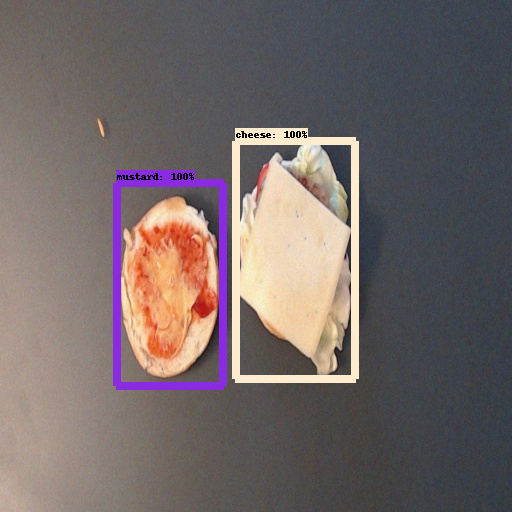

<class 'numpy.ndarray'>
detection_boxes = [[0.35489896 0.36397684 0.7115327  0.533597  ]
 [0.40686506 0.6007071  0.75302297 0.76359445]]
detection_scores = [0.9972759 0.9944078]
detection_classes = [1 1]
None


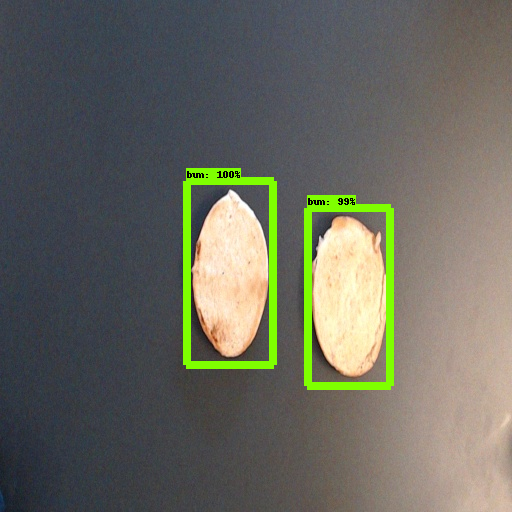

<class 'numpy.ndarray'>
detection_boxes = [[0.22032948 0.6338657  0.63124704 0.8162974 ]
 [0.22168797 0.38196024 0.6238131  0.5607015 ]]
detection_scores = [0.99703074 0.9966742 ]
detection_classes = [1 1]
None


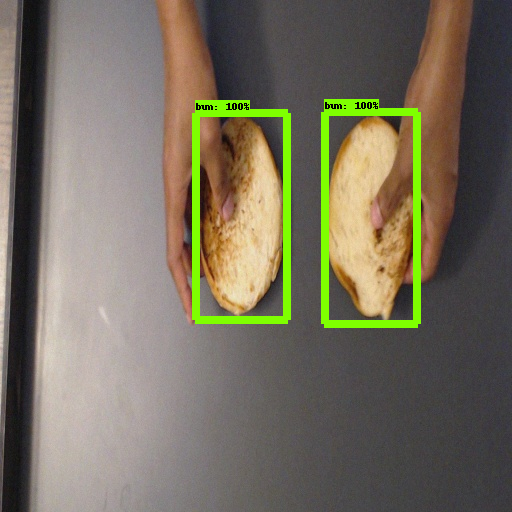

<class 'numpy.ndarray'>
detection_boxes = [[0.22829619 0.6419201  0.613474   0.9039824 ]
 [0.15855841 0.24307162 0.54863465 0.48986912]]
detection_scores = [0.9997993 0.9993067]
detection_classes = [3 1]
None


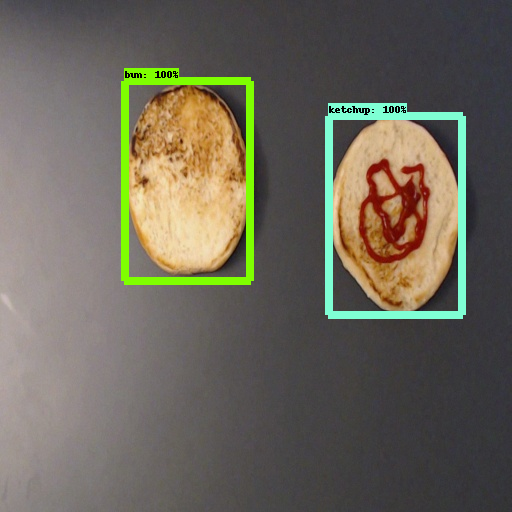

<class 'numpy.ndarray'>
detection_boxes = [[0.14509782 0.53578717 0.5426992  0.73035914]
 [0.1120946  0.23473644 0.51047695 0.43534923]]
detection_scores = [0.9984341 0.9962549]
detection_classes = [2 8]
None


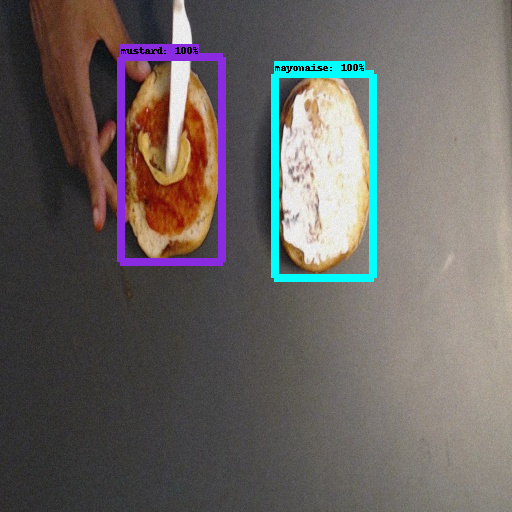

<class 'numpy.ndarray'>
detection_boxes = [[0.2580226  0.24279898 0.5704915  0.4414602 ]
 [0.25830114 0.5332389  0.5760658  0.74088573]]
detection_scores = [0.9990152 0.9953909]
detection_classes = [2 8]
None


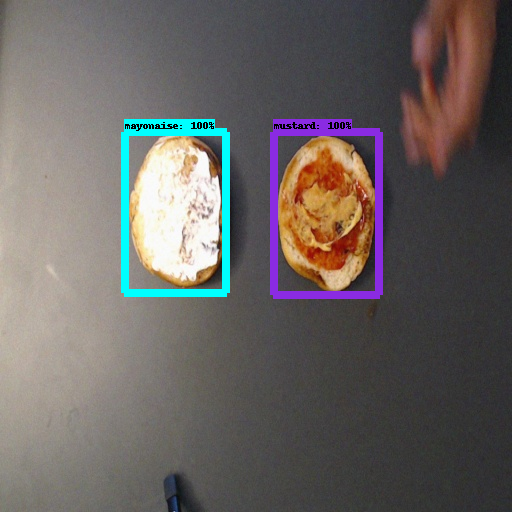

<class 'numpy.ndarray'>
detection_boxes = [[0.10768487 0.14450821 0.5411621  0.33216545]
 [0.17911571 0.46234867 0.59941673 0.6432685 ]]
detection_scores = [0.9985744  0.99658513]
detection_classes = [3 2]
None


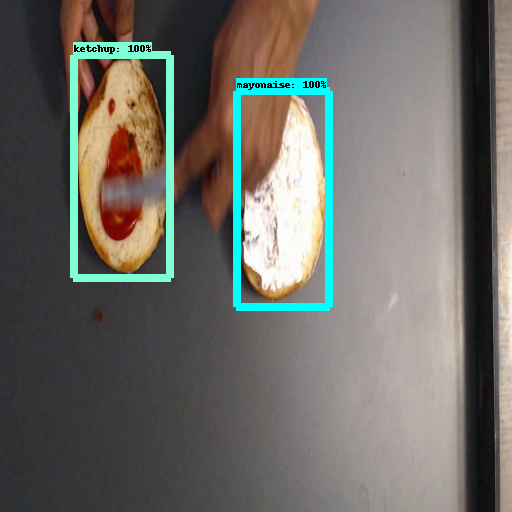

<class 'numpy.ndarray'>
detection_boxes = [[0.16995935 0.2572313  0.5323148  0.49528265]
 [0.17291178 0.6273233  0.5201578  0.8719701 ]]
detection_scores = [0.99918264 0.9966016 ]
detection_classes = [ 5 10]
None


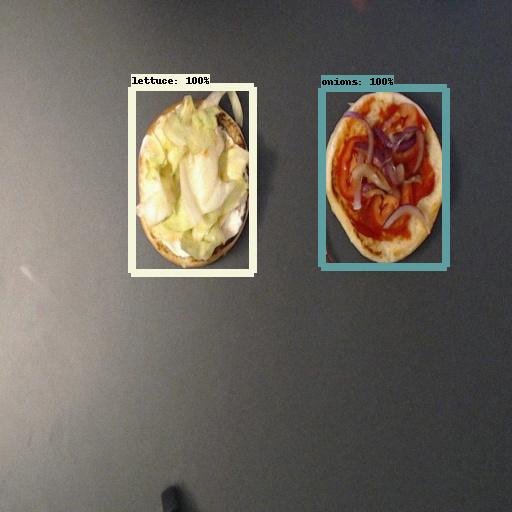

<class 'numpy.ndarray'>
detection_boxes = [[0.18009877 0.57172054 0.64204437 0.7537666 ]
 [0.18120517 0.2360102  0.66639394 0.4213342 ]]
detection_scores = [0.99853075 0.9932989 ]
detection_classes = [2 1]
None


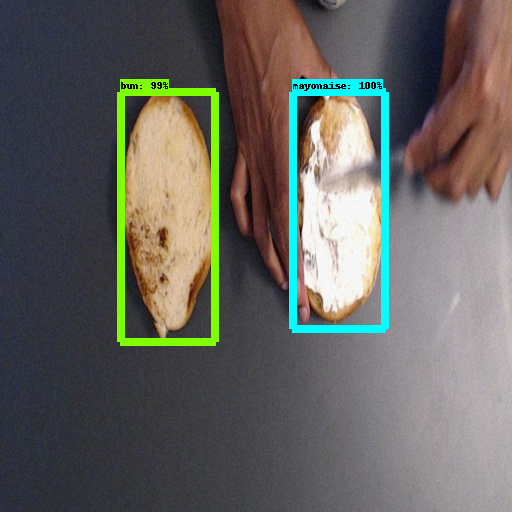

<class 'numpy.ndarray'>
detection_boxes = [[0.17589742 0.536894   0.5399374  0.7658301 ]
 [0.21065596 0.19657174 0.59014165 0.41192916]]
detection_scores = [0.99944824 0.99780303]
detection_classes = [3 2]
None


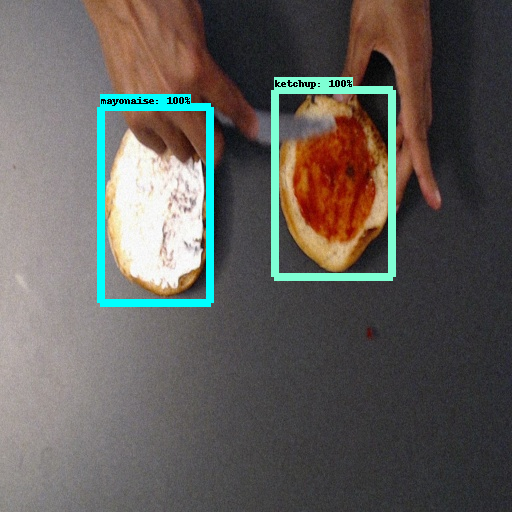

<class 'numpy.ndarray'>
detection_boxes = [[0.42308187 0.32046348 0.7534087  0.49177045]
 [0.38510174 0.56599015 0.7076271  0.7365292 ]]
detection_scores = [0.9985617 0.9980579]
detection_classes = [2 1]
None


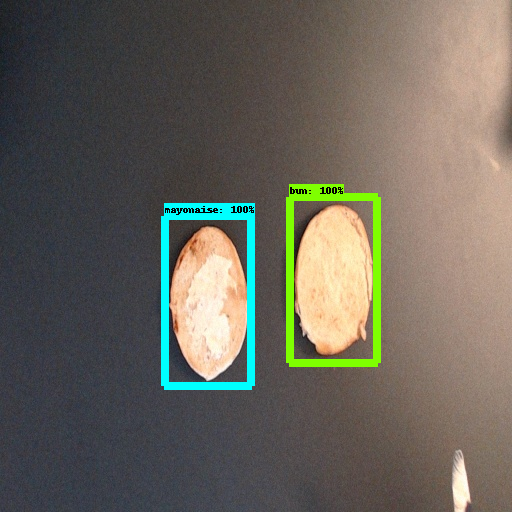

<class 'numpy.ndarray'>
detection_boxes = [[0.252456   0.20395201 0.55338395 0.36624777]
 [0.18586333 0.3994737  0.5310021  0.5709996 ]]
detection_scores = [0.9981165  0.99277097]
detection_classes = [8 4]
None


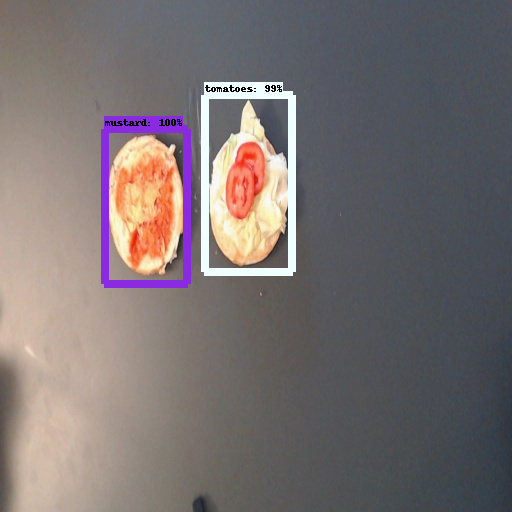

<class 'numpy.ndarray'>
detection_boxes = [[0.35304534 0.5794748  0.6428915  0.74964607]
 [0.2915462  0.3708668  0.6167487  0.56303823]]
detection_scores = [0.99704665 0.99453247]
detection_classes = [8 6]
None


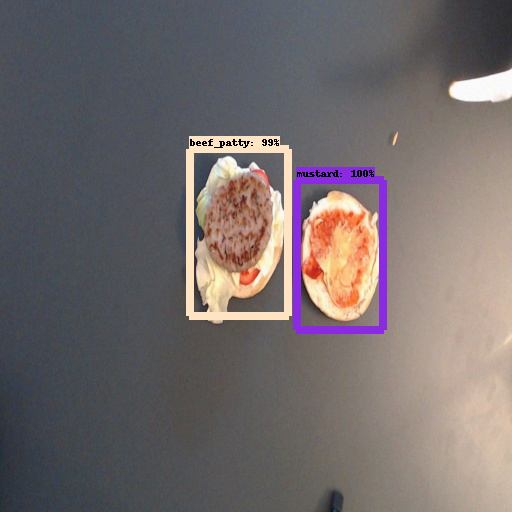

<class 'numpy.ndarray'>
detection_boxes = [[0.22614239 0.5562372  0.6471832  0.76919246]
 [0.33270216 0.3313467  0.7287426  0.52553046]]
detection_scores = [0.9993624  0.99877113]
detection_classes = [5 3]
None


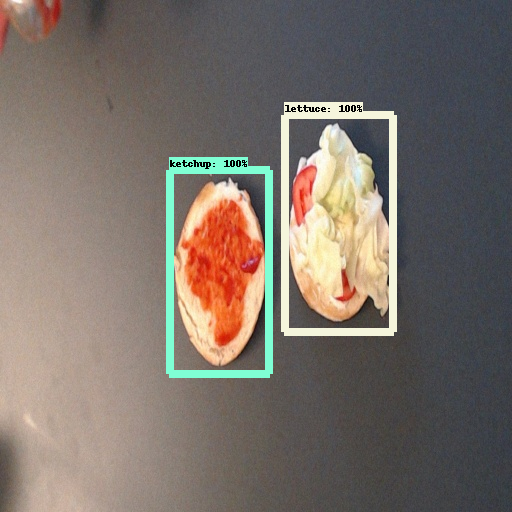

<class 'numpy.ndarray'>
detection_boxes = [[0.12539227 0.15226969 0.48763138 0.38951156]
 [0.15245095 0.5062162  0.51419497 0.7391893 ]]
detection_scores = [0.99883705 0.99668956]
detection_classes = [3 2]
None


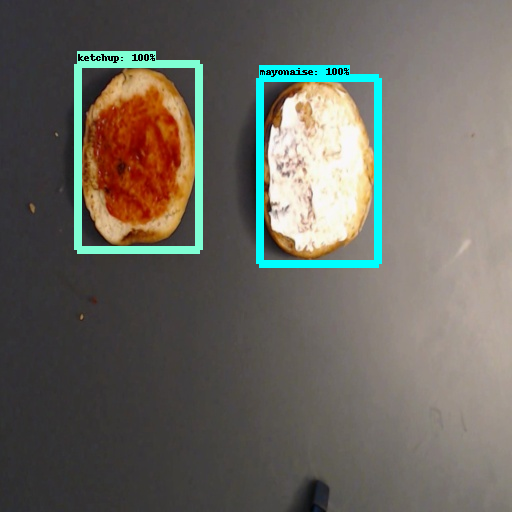

<class 'numpy.ndarray'>
detection_boxes = [[0.15611583 0.55495054 0.5749273  0.78506213]
 [0.16582271 0.18922034 0.57046974 0.42592028]]
detection_scores = [0.99953604 0.99609405]
detection_classes = [ 5 10]
None


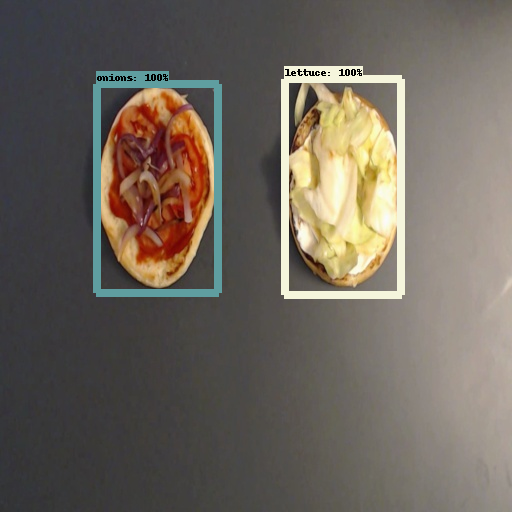

<class 'numpy.ndarray'>
detection_boxes = [[0.22104605 0.4321596  0.57950884 0.6598472 ]
 [0.2181127  0.07560409 0.56866664 0.30817157]]
detection_scores = [0.99849    0.99333364]
detection_classes = [ 5 10]
None


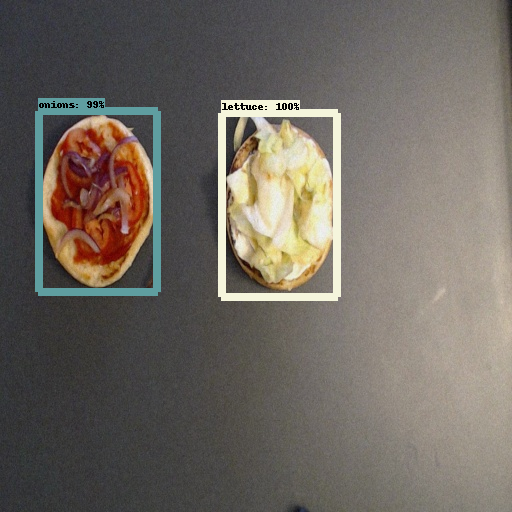

<class 'numpy.ndarray'>
detection_boxes = [[0.34120297 0.40342933 0.6522011  0.59756285]]
detection_scores = [0.99177706]
detection_classes = [2]
None


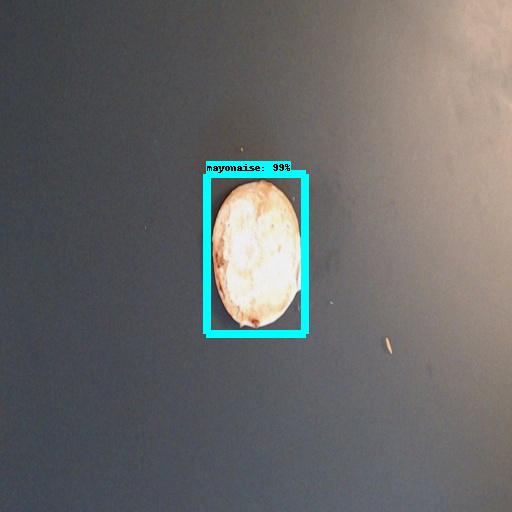

<class 'numpy.ndarray'>
detection_boxes = [[0.00282057 0.5347529  0.4957134  0.76090366]]
detection_scores = [0.9940187]
detection_classes = [9]
None


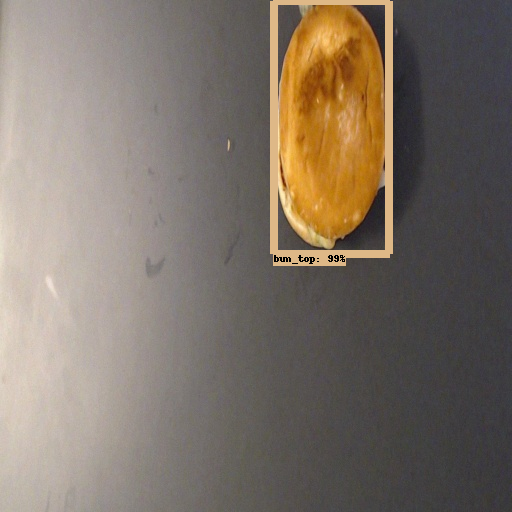

In [30]:
import cv2

for i, image_path in enumerate(glob.glob('Images_Aug/Test/*.jpg')):
  if i % 6 == 0:
    image = cv2.imread(image_path)
    image_np = np.array(cv2.cvtColor(image, cv2.COLOR_RGB2BGR))
    output_dict = run_inference_for_single_image(model, image_np)

    detection_boxes, detection_scores, detection_classes = select_best_bbs(output_dict, 0.95)
    print("detection_boxes = {}".format(detection_boxes))
    print("detection_scores = {}".format(detection_scores))
    print("detection_classes = {}".format(detection_classes))
    print(output_dict.get('detection_masks_reframed', None))

    # Visualization of the results of a detection.
    vis_util.visualize_boxes_and_labels_on_image_array(
        image_np,
        detection_boxes,
        detection_classes,
        detection_scores,
        category_index,
        instance_masks=output_dict.get('detection_masks_reframed', None),
        use_normalized_coordinates=True,
        line_thickness=8)
    display(Image.fromarray(image_np))

### Export custom object detection model to tflite format

In [ ]:
# This didn't work but the code in the next block did!

!python /content/models/research/object_detection/export_tflite_ssd_graph.py \
    --pipeline_config_path inference_graph/pipeline.config \
    --trained_checkpoint_prefix inference_graph/checkpoint \
    --output_directory tflite/ \
    --add_postprocessing_op=true

2024-07-16 17:34:20.182748: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-07-16 17:34:20.182811: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-07-16 17:34:20.184734: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-07-16 17:34:20.194663: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-07-16 17:34:21.674729: W tensorflow/compiler/tf2

In [ ]:
!python /content/models/research/object_detection/export_tflite_graph_tf2.py \
    --pipeline_config_path inference_graph/pipeline.config \
    --trained_checkpoint_dir inference_graph/checkpoint \
    --output_directory tflite/

2024-07-17 15:45:05.612968: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-07-17 15:45:05.613021: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-07-17 15:45:05.615018: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-07-17 15:45:06.566591: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
2024-07-17 15:45:09.248739: W tensorflow/core/common_runtime/gpu/gpu_bfc_allocator.cc:47] Overriding orig_value setting because the TF_FORCE_GPU_ALLOW_GROWTH environment variable is set. Original config value was 0.
I0717 15:45:09.272287 137

In [ ]:
import tensorflow as tf

converter = tf.lite.TFLiteConverter.from_saved_model('/content/tflite/saved_model') # path to the SavedModel directory
tflite_model = converter.convert()

# Save the model.
with open('/content/tflite/efficientdet_lite0_custom.tflite', 'wb') as f:
  f.write(tflite_model)

### Add Metadata

In [ ]:
from object_detection.utils import label_map_util

# We need to convert the Object Detection API's labelmap into what the Task API needs:
# a txt file with one class name on each line from index 0 to N.
# The first '0' class indicates the background.
# This code uses the label map file for the model you re-trained.
_ODT_LABEL_MAP_PATH = 'labelmap.pbtxt'
_TFLITE_LABEL_PATH = "/content/tflite_label_map.txt"

category_index = label_map_util.create_category_index_from_labelmap(
    _ODT_LABEL_MAP_PATH)
f = open(_TFLITE_LABEL_PATH, 'w')
for class_id in range(1, 10):
  if class_id not in category_index:
    f.write('???\n')
    continue
  name = category_index[class_id]['name']
  f.write(name+'\n')
f.close()

In [ ]:
!pip install tflite_support_nightly

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 60.8/60.8 MB 11.3 MB/s eta 0:00:00


In [ ]:
from tflite_support.metadata_writers import object_detector
from tflite_support.metadata_writers import writer_utils

_TFLITE_MODEL_WITH_METADATA_PATH = '/content/tflite/efficientdet_custom_with_metadata.tflite'

writer = object_detector.MetadataWriter.create_for_inference(
    writer_utils.load_file('/content/tflite/efficientdet_lite0_custom.tflite'), input_norm_mean=[127.5],
    input_norm_std=[127.5], label_file_paths=[_TFLITE_LABEL_PATH])
writer_utils.save_file(writer.populate(), _TFLITE_MODEL_WITH_METADATA_PATH)